In [ ]:
!pip install tensorflow
# General Imports
import tensorflow as tf
import pandas as pd
import numpy as np
import random
import os

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Warnings
import warnings
warnings.filterwarnings("ignore")

# Building Model
from keras.utils import plot_model
from tensorflow.keras import models
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.optimizers import legacy


# Training Model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential

# Model Evaluation
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay

# Data Processing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import load_img

In [ ]:
path = 'C:\\Users\\Administrator\\fahria salsabilla\\dataset tumor\\dataset tumor'

print("Path to dataset files:", path)

Path to dataset files: C:\Users\Administrator\fahria salsabilla\dataset tumor\dataset tumor


In [ ]:
import os
classes=[]
filename= 'C:\\Users\\Administrator\\fahria salsabilla\\dataset tumor\\dataset tumor'
for sub_folder in os.listdir(os.path.join(filename,'Training')):
    classes.append(sub_folder)
print(classes)

['glioma', 'meningioma', 'notumor', 'pituitary']


In [ ]:
train_path='C:\\Users\\Administrator\\fahria salsabilla\\dataset tumor\\dataset tumor\\Training/' # Corrected the path
test_path='C:\\Users\\Administrator\\fahria salsabilla\\dataset tumor\\dataset tumor\\Testing/'

In [ ]:
img_list=[]
label_list=[]
for label in classes:
    for img_file in os.listdir(train_path+label):
        img_list.append(train_path+label+'/'+img_file)
        label_list.append(label)

In [ ]:
# Import pandas library first
import pandas as pd

# Then create your DataFrame
train_data = pd.DataFrame({'Image':img_list,'Label':label_list})
train_data

,Image,Label
0,C:\Users\Administrator\fahria salsabilla\datas...,glioma
1,C:\Users\Administrator\fahria salsabilla\datas...,glioma
2,C:\Users\Administrator\fahria salsabilla\datas...,glioma
3,C:\Users\Administrator\fahria salsabilla\datas...,glioma
4,C:\Users\Administrator\fahria salsabilla\datas...,glioma
...,...,...
5700,C:\Users\Administrator\fahria salsabilla\datas...,pituitary
5701,C:\Users\Administrator\fahria salsabilla\datas...,pituitary
5702,C:\Users\Administrator\fahria salsabilla\datas...,pituitary
5703,C:\Users\Administrator\fahria salsabilla\datas...,pituitary


In [ ]:
img_list=[]
label_list=[]
for label in classes:
    for img_file in os.listdir(test_path+label):
        img_list.append(test_path+label+'/'+img_file)
        label_list.append(label)

In [ ]:
test_data = pd.DataFrame({'Image':img_list,'Label':label_list})
test_data

,Image,Label
0,C:\Users\Administrator\fahria salsabilla\datas...,glioma
1,C:\Users\Administrator\fahria salsabilla\datas...,glioma
2,C:\Users\Administrator\fahria salsabilla\datas...,glioma
3,C:\Users\Administrator\fahria salsabilla\datas...,glioma
4,C:\Users\Administrator\fahria salsabilla\datas...,glioma
...,...,...
1306,C:\Users\Administrator\fahria salsabilla\datas...,pituitary
1307,C:\Users\Administrator\fahria salsabilla\datas...,pituitary
1308,C:\Users\Administrator\fahria salsabilla\datas...,pituitary
1309,C:\Users\Administrator\fahria salsabilla\datas...,pituitary


In [ ]:
def Plot_Classes(BASE_URL, Rows=2, Columns=5):


  plt.figure(figsize = (25, 8))

  image_count = 1

  for directory in os.listdir(BASE_URL):

      if directory[0] != '.':

          Max_Random = len(os.listdir(os.path.join(BASE_URL,directory)))

          Random_Number = np.random.randint(0, Max_Random)

          for i, file in enumerate(os.listdir(BASE_URL + directory)):

              if i == Random_Number:

                  fig = plt.subplot(Rows, Columns, image_count)
                  image_count += 1

                  image = plt.imread(BASE_URL + directory + '/' + file)
                  plt.imshow(image)

                  plt.title(directory)

                  break

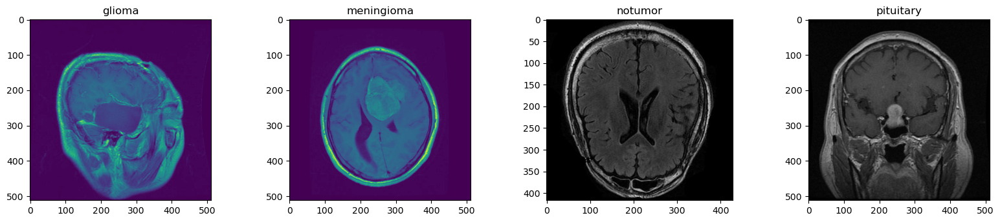

In [ ]:
# Import numpy first
import numpy as np

# Import matplotlib.pyplot
import matplotlib.pyplot as plt

# Then call your function
Plot_Classes(train_path)

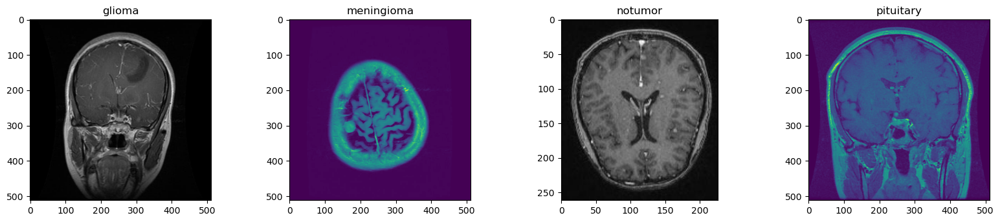

In [ ]:
# Import numpy first
import numpy as np

# Import matplotlib.pyplot
import matplotlib.pyplot as plt

# Define the correct path to your dataset
# Make sure this path actually exists on your system
test_path = 'C:\\Users\\Administrator\\fahria salsabilla\\dataset tumor\\dataset tumor\\Testing/'

# Check if the path exists before calling the function
import os
if not os.path.exists(test_path):
    print(f"The path {test_path} does not exist. Please check your path.")
else:
    # If you need to access a specific subfolder like 'glioma', include it in the path
    # test_path = os.path.join(test_path, 'glioma')

    # Or modify your Plot_Classes function to not append 'glioma' to the path
    # Without seeing the Plot_Classes function, I'm assuming it's trying to access a subfolder
    Plot_Classes(test_path)  # Make sure this function is defined before calling it

In [ ]:
train_data['Label'].value_counts()

Label
notumor       1578
pituitary     1457
meningioma    1339
glioma        1331
Name: count, dtype: int64

In [ ]:
# Import Plotly Express first
import plotly.express as px

# Now you can use px
px.histogram(train_data, y="Label", color="Label", title="Classes Distribution")

In [ ]:
test_data['Label'].value_counts()

Label
notumor       405
meningioma    306
glioma        300
pituitary     300
Name: count, dtype: int64

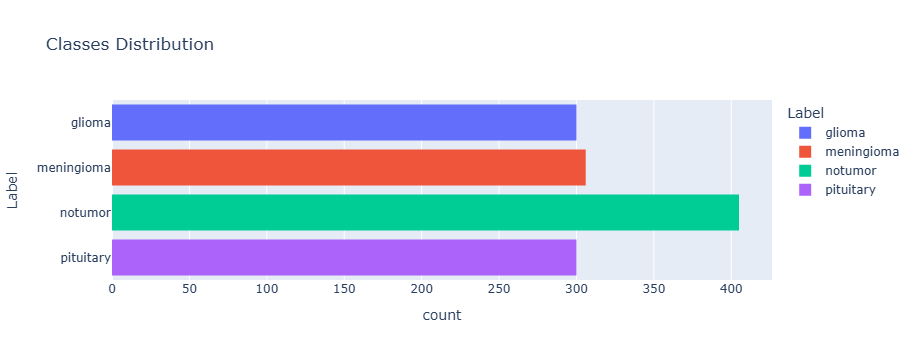

In [ ]:
px.histogram(test_data, y="Label", color="Label", title="Classes Distribution")

In [ ]:
# Image size
image_size = (224, 224)

# Training batch size
batch_size = 32

In [ ]:

train_path='C:\\Users\\Administrator\\fahria salsabilla\\tumor otak dataset\\tumor otak dataset\\Training' # Corrected the path
test_path='C:\\Users\\Administrator\\fahria salsabilla\\tumor otak dataset\\tumor otak dataset\\Testing'

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.85, 1.15),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=12.5,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")

# Ubah validation_split menjadi 0.1 (10% data untuk testing)
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.1)

train_generator = datagen.flow_from_directory(
   'C:\\Users\\Administrator\\fahria salsabilla\\tumor otak dataset',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',  # Ini akan ambil 90% data
    seed=42
)

test_generator = datagen.flow_from_directory(
   'C:\\Users\\Administrator\\fahria salsabilla\\tumor otak dataset',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',  # Ini akan ambil 10% data
    seed=42,
    shuffle=False
)


Found 6316 images belonging to 4 classes.
Found 700 images belonging to 4 classes.


In [ ]:
import matplotlib.pyplot as plt

def show_ImageDataGenerator(ImageDataGenerator, num_samples=5, figsize=(12, 12), save=False):
    """
    Menampilkan hasil augmentasi dari ImageDataGenerator dengan garis batas ukuran gambar.
    """

    # Ambil batch gambar yang sudah diaugmentasi
    augmented_samples = train_generator.__next__()
    images = augmented_samples[0][:num_samples]

    # Menampilkan gambar-gambar dengan garis pinggir
    fig, axes = plt.subplots(1, num_samples, figsize=figsize)

    for i, ax in enumerate(axes):
        img = images[i]
        ax.imshow(img)
        ax.axis('on')
        height, width = img.shape[:2]

        # Tambahkan border merah
        ax.add_patch(plt.Rectangle((0, 0), width, height,
                                   edgecolor='red', fill=False, linewidth=2))

        # Tambahkan teks ukuran gambar
        ax.set_title(f"{width}x{height}", fontsize=10)

    plt.tight_layout()

    if save:
        plt.savefig('show_ImageDataGenerator_with_border.pdf')

    plt.show()


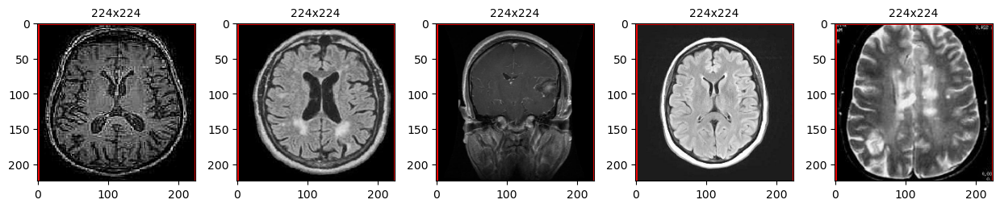

In [ ]:
show_ImageDataGenerator(train_generator, num_samples=5, figsize=(12.5, 8), save=False) # Changed 'train_datagen' to 'train_generator'

In [ ]:
# Image shape: height, width, RBG
image_shape = (image_size[0], image_size[1], 3)


print(f'Image shape: {image_shape}')
print(f'Batch size: {batch_size}')
print(f'Number of Train batches: {len(train_generator)}')
print(f'Number of Testing batches: {len(test_generator)}')

Image shape: (224, 224, 3)
Batch size: 32
Number of Train batches: 198
Number of Testing batches: 22


In [ ]:
Classes_Map = train_generator.class_indices

num_classes = len(Classes_Map)

print("Number of Classes:", num_classes)
Classes_Map

Number of Classes: 4


{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}

In [ ]:
def plot_curves(history):

  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  plt.figure(figsize=(15,5))
  plt.style.use('ggplot')


  plt.subplot(1, 2, 1)
  plt.plot(epochs, loss, 'bo-' , label = "TrainL oss")
  plt.plot(epochs, val_loss, 'o-' , color='orange', label = "Val Loss")
  plt.title("Loss")
  plt.xlabel("epochs")
  plt.legend()


  plt.subplot(1, 2, 2)
  plt.plot(epochs, accuracy, 'bo-' , label = "Train Acc")
  plt.plot(epochs, val_accuracy, 'o-' , color='orange' , label = "Val Acc")
  plt.title("Accuracy")
  plt.xlabel("epochs")
  plt.legend()

  plt.style.use('default')

In [ ]:
def CM(model, test_generator, categories):
    """
    Function to return the confusion matrix of a given CNN model.
    """
    from sklearn.metrics import confusion_matrix
    # Predictions on test dataset
    predictions = model.predict(test_generator)
    predicted_categories = np.argmax(predictions, axis=1)
    true_categories = test_generator.classes

    # Create a confusion matrix
    confusion_matrix_array = confusion_matrix(true_categories, predicted_categories)
    print(f"Classification Report for {model}:")
    print(classification_report(true_categories, predicted_categories, target_names=categories))

    return confusion_matrix_array


def calculate_metrics(confusion_matrix, categories):
    """
    Function to calculate important metrics for multi-classification problems.
    """
    # Calculating 4 different metrics
    precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=0)
    recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=1)
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = np.sum(np.diag(confusion_matrix)) / np.sum(confusion_matrix)

    # Printing the results based on each category
    for i, category in enumerate(categories):
        print(f"Class: {category.title()}")
        print(f"Precision: {precision[i]:.3f}")
        print(f"Recall: {recall[i]:.3f}")
        print(f"F1-Score: {f1_score[i]:.3f}\n")

    # Showing the total accuracy of the model
    print(f"\nAccuracy: {accuracy:.3f}")

In [ ]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam


base_model_vgg = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


for layer in base_model_vgg.layers[:-10]:
    layer.trainable = False

for layer in base_model_vgg.layers[-10:]:
    layer.trainable = True

# Add custom classification head
x = base_model_vgg.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

model_vgg = Model(inputs=base_model_vgg.input, outputs=output)

model_vgg.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

model_vgg.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 20,289,092 (77.40 MB)

 Trainable params: 17,963,524 (68.53 MB)

 Non-trainable params: 2,325,568 (8.87 MB)

In [ ]:
vgg_history = model_vgg.fit(train_generator,epochs=20,validation_data=test_generator) # Use test_generator as the validation data

Epoch 1/20
198/198 ━━━━━━━━━━━━━━━━━━━━ 2399s 12s/step - accuracy: 0.6704 - loss: 0.7725 - val_accuracy: 0.8557 - val_loss: 0.4283
Epoch 2/20
198/198 ━━━━━━━━━━━━━━━━━━━━ 2311s 12s/step - accuracy: 0.9043 - loss: 0.2650 - val_accuracy: 0.9114 - val_loss: 0.2270
Epoch 3/20
198/198 ━━━━━━━━━━━━━━━━━━━━ 2308s 12s/step - accuracy: 0.9517 - loss: 0.1422 - val_accuracy: 0.8857 - val_loss: 0.3177
Epoch 4/20
198/198 ━━━━━━━━━━━━━━━━━━━━ 2331s 12s/step - accuracy: 0.9580 - loss: 0.1211 - val_accuracy: 0.9314 - val_loss: 0.1796
Epoch 5/20
198/198 ━━━━━━━━━━━━━━━━━━━━ 2316s 12s/step - accuracy: 0.9707 - loss: 0.0800 - val_accuracy: 0.9586 - val_loss: 0.1263
Epoch 6/20
198/198 ━━━━━━━━━━━━━━━━━━━━ 2312s 12s/step - accuracy: 0.9746 - loss: 0.0788 - val_accuracy: 0.9686 - val_loss: 0.1232
Epoch 7/20
198/198 ━━━━━━━━━━━━━━━━━━━━ 2382s 12s/step - accuracy: 0.9817 - loss: 0.0584 - val_accuracy: 0.9671 - val_loss: 0.1303
Epoch 8/20
198/198 ━━━━━━━━━━━━━━━━━━━━ 2470s 12s/step - accuracy: 0.9835 - loss: 0

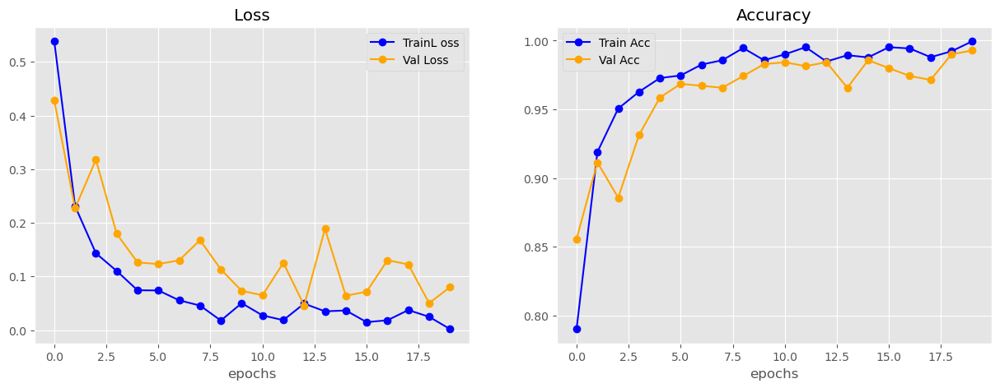

In [ ]:
plot_curves(vgg_history)

In [ ]:
loss, accuracy = model_vgg.evaluate(test_generator)
print(f"Test Loss: {loss:0.5f}")
print(f"Test Accuracy: {accuracy:0.5f}")

22/22 ━━━━━━━━━━━━━━━━━━━━ 132s 6s/step - accuracy: 0.9844 - loss: 0.1471
Test Loss: 0.08006
Test Accuracy: 0.99286


22/22 ━━━━━━━━━━━━━━━━━━━━ 132s 6s/step
Classification Report for <Functional name=functional, built=True>:
              precision    recall  f1-score   support

      glioma       1.00      0.98      0.99       163
  meningioma       0.97      1.00      0.98       164
     notumor       1.00      1.00      1.00       198
   pituitary       1.00      0.99      1.00       175

    accuracy                           0.99       700
   macro avg       0.99      0.99      0.99       700
weighted avg       0.99      0.99      0.99       700



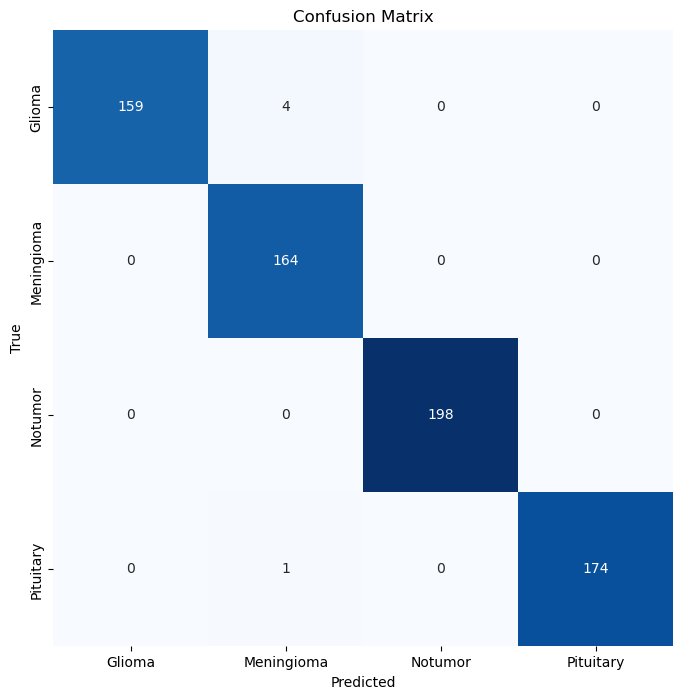

In [ ]:
# Import the missing function
import seaborn as sns  # Added import for seaborn
import numpy as np     # Added import for numpy (needed for np.arange)
import matplotlib.pyplot as plt  # Added explicit import for matplotlib
from sklearn.metrics import classification_report

# Plotting confusion matrix
confusion_matrix = CM(model=model_vgg, test_generator=test_generator, categories=classes)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], ha='center')
plt.yticks(ticks=np.arange(4) + 0.5,
           labels=[name.title() for name in classes], va='center')
plt.show()

{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}


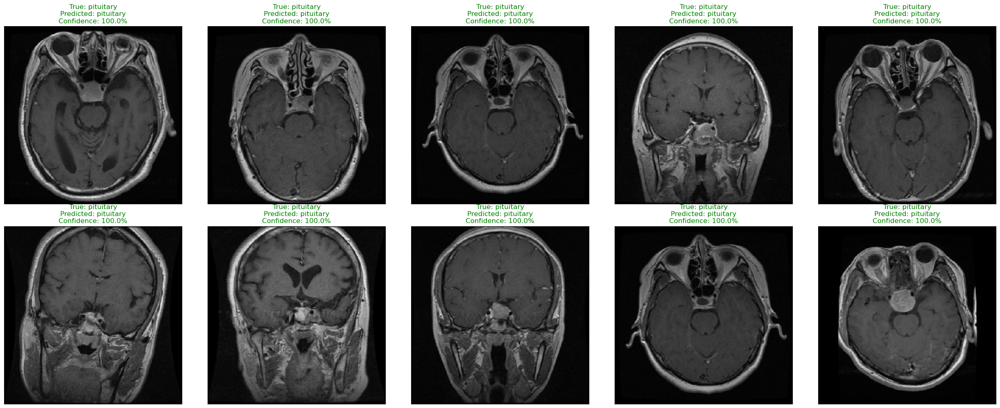

In [ ]:
# Import TensorFlow at the beginning of your code
import tensorflow as tf

# Display 10 random pictures predictions from the dataset with their labels
Random_batch = np.random.randint(0, len(test_generator))
Random_Img_Index = np.random.randint(0, batch_size, 10)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    Random_Img = test_generator[Random_batch][0][Random_Img_Index[i]]
    Random_Img_Label = np.argmax(test_generator[Random_batch][1][Random_Img_Index[i]])

    # This line was causing the error because tf wasn't imported
    Model_Predictions = model_vgg.predict(tf.expand_dims(Random_Img, axis=0), verbose=0)

    Model_Highest_Prediction = np.argmax(Model_Predictions)
    Model_Predictions_Map = {c: round(p*100, 3) for (c, p) in zip(classes, Model_Predictions.tolist()[0])}

    ax.imshow(Random_Img)

    Pred_Class = classes[Model_Highest_Prediction]

    if classes[Random_Img_Label] == Pred_Class:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {classes[Random_Img_Label]}\nPredicted: {Pred_Class}\nConfidence: {Model_Predictions_Map[Pred_Class]}%",
          color=color)
    print(Model_Predictions_Map)

# Move tight_layout before show for better formatting
plt.tight_layout()
plt.show()

In [ ]:
def predict(img_path):
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image

    # Pastikan class_dict sesuai urutan output dari model kamu
    class_dict = {
        'glioma': 0,
        'meningioma': 1,
        'notumor': 2,
        'pituitary': 3
    }

    labels = list(class_dict.keys())

    plt.figure(figsize=(10, 8))

    # Baca dan resize gambar sesuai input model
    img = Image.open(img_path)
    resized_img = img.resize((224, 224))
    img_array = np.asarray(resized_img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Prediksi
    predictions = model_vgg.predict(img_array)
    probs = predictions[0]

    # Tampilkan gambar
    plt.subplot(2, 1, 1)
    plt.imshow(resized_img)
    plt.axis('off')

    # Bar chart prediksi
    plt.subplot(2, 1, 2)
    bars = plt.barh(labels, probs, color='dodgerblue')
    plt.xlabel('Probability', fontsize=12)
    plt.xlim(0, 1)
    plt.tight_layout()

    ax = plt.gca()
    ax.bar_label(bars, fmt='%.2f')
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


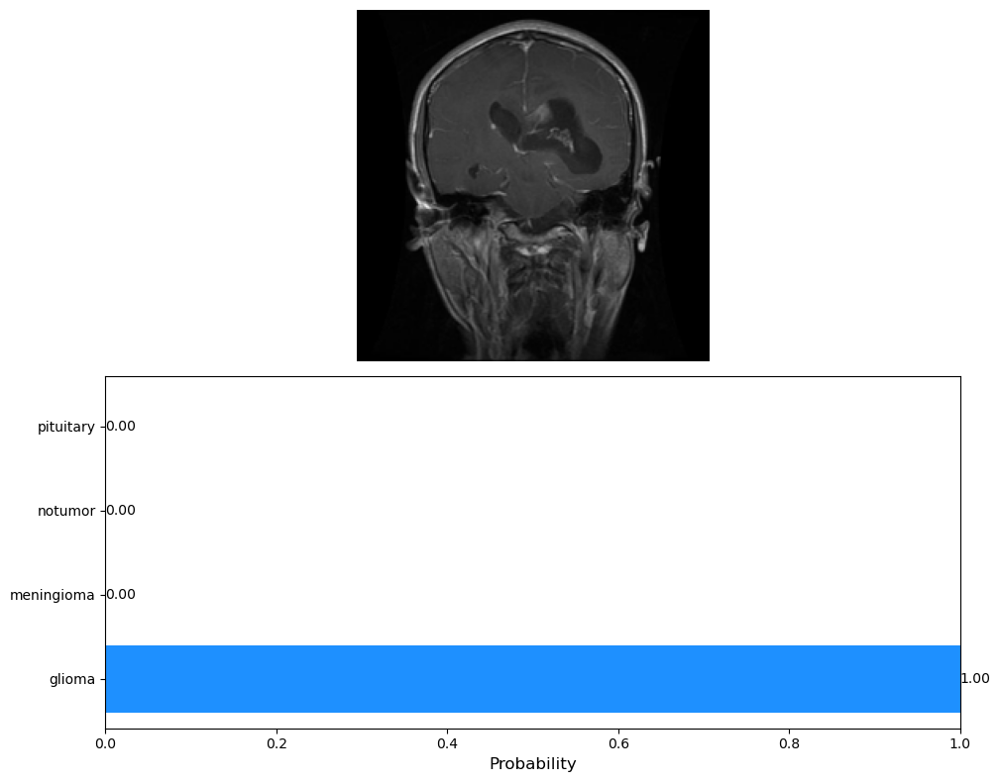

In [ ]:
predict( 'C:\\Users\\Administrator\\fahria salsabilla\\tumor otak dataset\\glioma\\Tr-glTr_0004.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


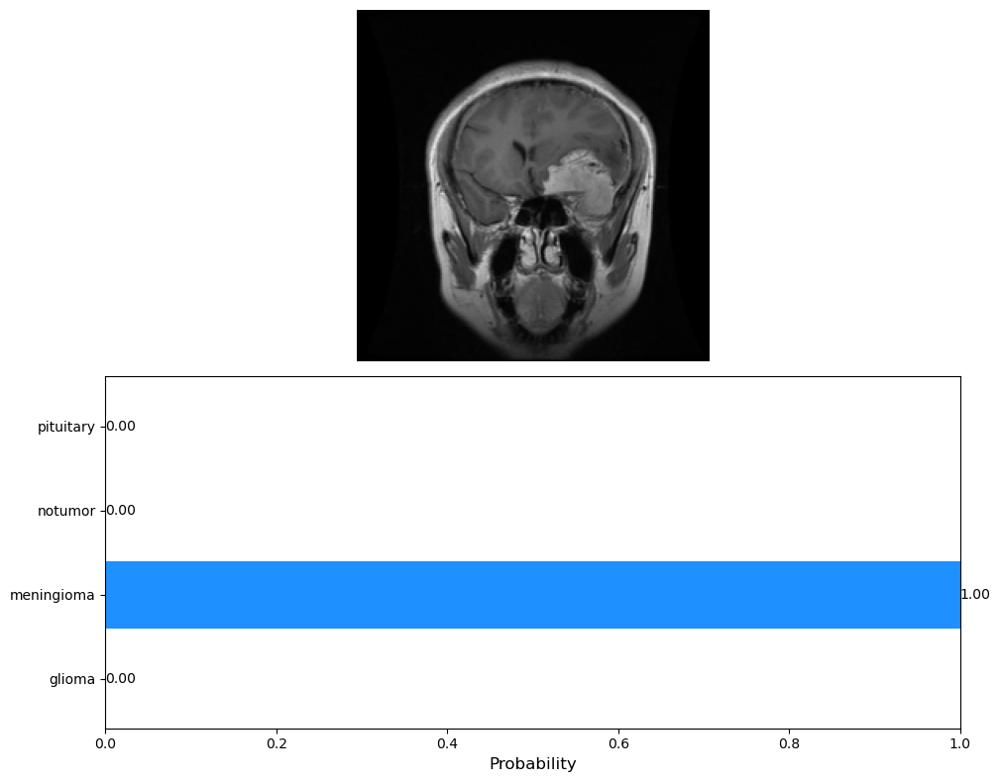

In [ ]:
predict('C:\\Users\\Administrator\\fahria salsabilla\\tumor otak dataset//meningioma/Tr-meTr_0009.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 297ms/step


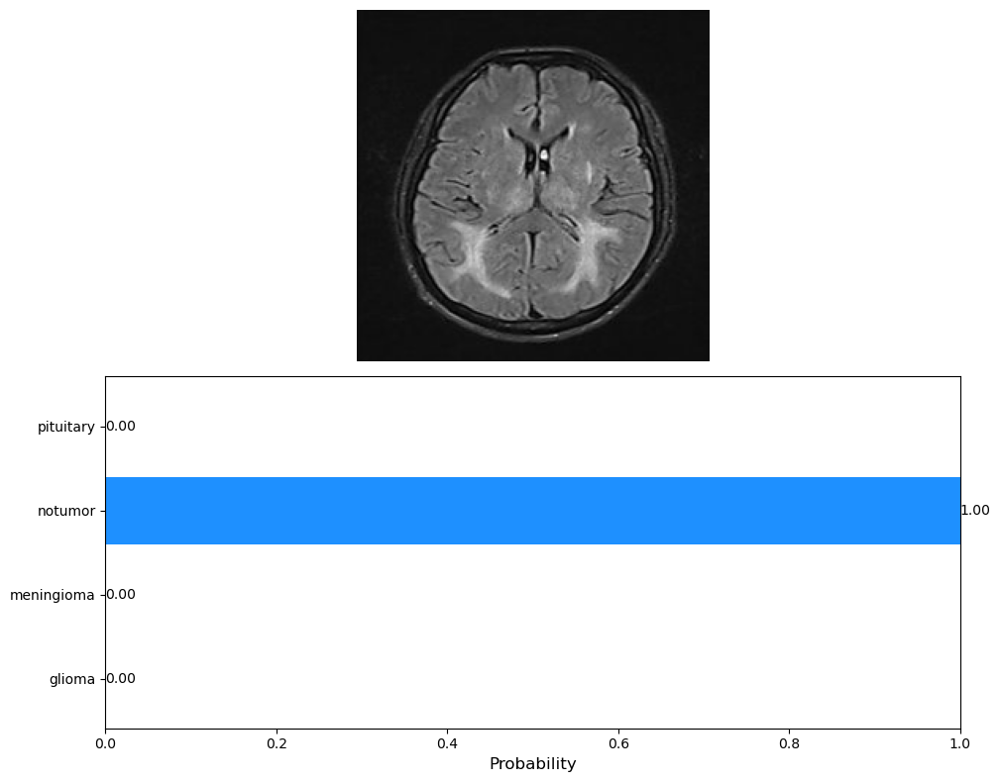

In [ ]:
predict('C:\\Users\\Administrator\\fahria salsabilla\\tumor otak dataset//notumor/Te-noTr_0001.jpg')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step


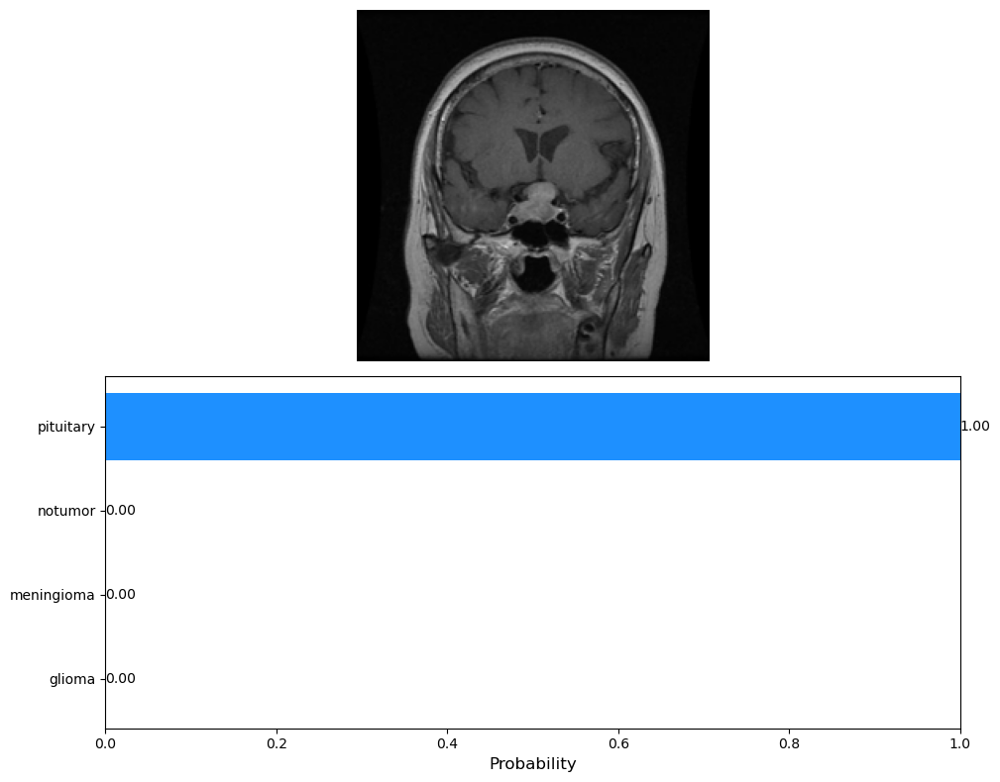

In [ ]:
predict('C:\\Users\\Administrator\\fahria salsabilla\\tumor otak dataset//pituitary/Tr-piTr_0007.jpg')

{'glioma': 0.0, 'meningioma': 0.002, 'notumor': 99.997, 'pituitary': 0.001}
{'glioma': 0.0, 'meningioma': 100.0, 'notumor': 0.0, 'pituitary': 0.0}
{'glioma': 0.0, 'meningioma': 0.001, 'notumor': 99.998, 'pituitary': 0.001}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 100.0, 'notumor': 0.0, 'pituitary': 0.0}
{'glioma': 99.19, 'meningioma': 0.729, 'notumor': 0.008, 'pituitary': 0.073}
{'glioma': 0.0, 'meningioma': 100.0, 'notumor': 0.0, 'pituitary': 0.0}
{'glioma': 0.0, 'meningioma': 0.0, 'notumor': 0.0, 'pituitary': 100.0}
{'glioma': 0.0, 'meningioma': 0.001, 'notumor': 99.998, 'pituitary': 0.001}
{'glioma': 0.0, 'meningioma': 0.001, 'notumor': 99.999, 'pituitary': 0.0}


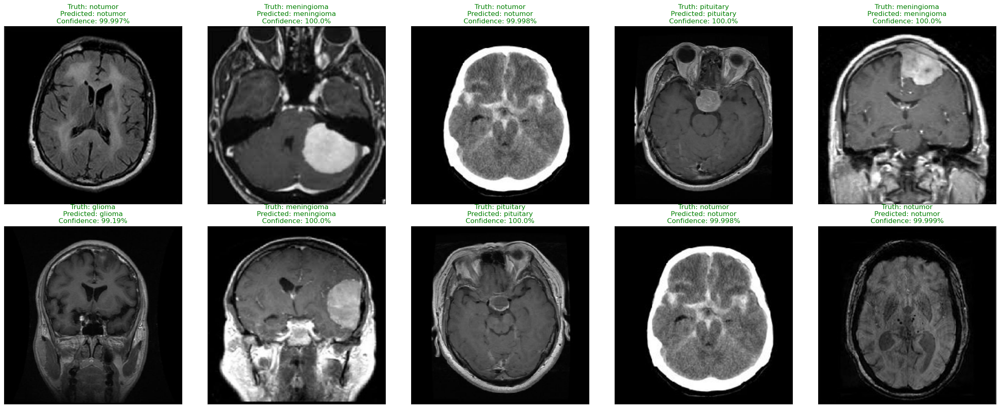

In [ ]:
# Ambil seluruh data dari test_generator
all_images = []
all_labels = []

for i in range(len(test_generator)):
    imgs, labels = test_generator[i]
    for img, label in zip(imgs, labels):
        all_images.append(img)
        all_labels.append(label)

# Pilih 10 indeks acak dari seluruh dataset
random_indices = np.random.choice(len(all_images), size=10, replace=False)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    idx = random_indices[i]
    img = all_images[idx]
    true_label = np.argmax(all_labels[idx])

    # Prediksi
    prediction = model_vgg.predict(tf.expand_dims(img, axis=0), verbose=0)
    predicted_label = np.argmax(prediction)

    # Mapping confidence
    prediction_confidence = {c: round(p * 100, 3) for c, p in zip(classes, prediction[0])}
    predicted_class = classes[predicted_label]

    color = "green" if predicted_class == classes[true_label] else "red"

    ax.imshow(img)
    ax.set_title(f"Truth: {classes[true_label]}\nPredicted: {predicted_class}\nConfidence: {prediction_confidence[predicted_class]}%", color=color)

    print(prediction_confidence)

plt.tight_layout()
plt.show()


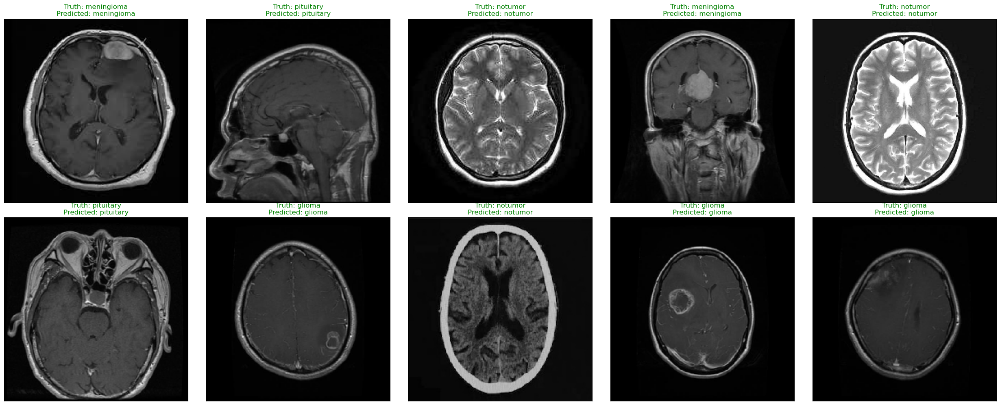

In [ ]:
# Ambil seluruh gambar dan label dari test_generator
all_images = []
all_labels = []

for i in range(len(test_generator)):
    images, labels = test_generator[i]
    for img, label in zip(images, labels):
        all_images.append(img)
        all_labels.append(label)

# Pilih 10 gambar acak
random_indices = np.random.choice(len(all_images), size=10, replace=False)

# Plot
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 10),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    idx = random_indices[i]
    img = all_images[idx]
    true_label = np.argmax(all_labels[idx])

    prediction = model_vgg.predict(tf.expand_dims(img, axis=0), verbose=0)
    predicted_label = np.argmax(prediction)

    pred_class = classes[predicted_label]
    true_class = classes[true_label]

    color = "green" if pred_class == true_class else "red"

    ax.imshow(img)
    ax.set_title(f"Truth: {true_class}\nPredicted: {pred_class}", color=color)

plt.tight_layout()
plt.show()
